# Prepare some things
## Load some modules

In [1]:
from sklearn.cluster import KMeans
from sklearn.mixture import GaussianMixture
from sklearn.decomposition import PCA
from sklearn.manifold import TSNE
from sklearn.preprocessing import MinMaxScaler
import sklearn.metrics
from scipy.cluster import hierarchy
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt

In [2]:
import sys
sys.path.append('../../')
from clustering_metrics import evaluate_clustering
from draw_embeddings import draw_multiple_labels

## Load the metabolomic data

In [3]:
metabol_serum_exprs = pd.read_csv("../ExposomeChallengeData/datasets/metabol_serum_exprs.csv", index_col=0).T
metabol_urine_exprs = pd.read_csv("../ExposomeChallengeData/datasets/metabol_urine_exprs.csv", index_col=0).T

print(f'Serum features number: {metabol_serum_exprs.shape[1]}')
print(f'Urine features number: {metabol_urine_exprs.shape[1]}')

Serum features number: 177
Urine features number: 44


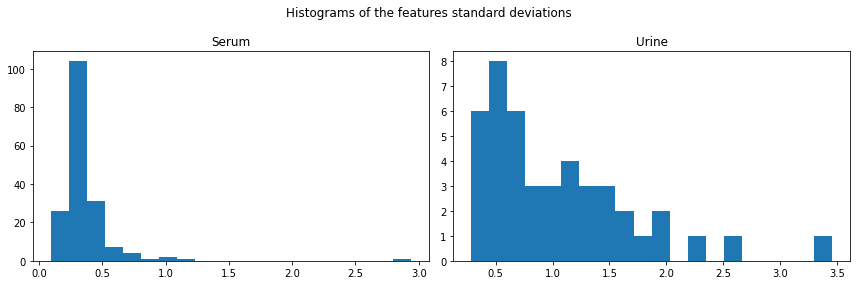

In [4]:
fig, ax = plt.subplots(1, 2, figsize=(12, 4))
ax[0].hist(metabol_serum_exprs.std(axis=0), bins=20);
ax[0].title.set_text("Serum")
ax[1].hist(metabol_urine_exprs.std(axis=0), bins=20);
ax[1].title.set_text("Urine")
fig.suptitle("Histograms of the features standard deviations")
plt.tight_layout()

In [5]:
index = metabol_serum_exprs.std(axis=0) > 0.4
metabol_serum_exprs = metabol_serum_exprs.loc[:, index]

index = metabol_urine_exprs.std(axis=0) > 1.5
metabol_urine_exprs = metabol_urine_exprs.loc[:, index]

print(f'Selected serum features number: {metabol_serum_exprs.shape[1]}')
print(f'Selected urine features number: {metabol_urine_exprs.shape[1]}')

Selected serum features number: 38
Selected urine features number: 10


In [6]:
metabol_exprs = pd.concat([metabol_serum_exprs.rename('serum_{}'.format, axis=1),
                           metabol_urine_exprs.rename('urine_{}'.format, axis=1)], axis=1)
columns, index = metabol_exprs.columns, metabol_exprs.index
metabol_exprs = pd.DataFrame(MinMaxScaler().fit_transform(metabol_exprs))
metabol_exprs.columns, metabol_exprs.index = columns, index
metabol_exprs.head()

,serum_metab_1,serum_metab_4,serum_metab_7,serum_metab_10,serum_metab_16,serum_metab_18,serum_metab_29,serum_metab_30,serum_metab_31,serum_metab_33,...,urine_metab_14,urine_metab_19,urine_metab_20,urine_metab_22,urine_metab_24,urine_metab_28,urine_metab_34,urine_metab_36,urine_metab_38,urine_metab_42
430,0.224542,0.653163,0.249523,0.574663,0.497960,0.456661,0.229619,0.523809,0.097272,0.497267,...,0.801181,0.710854,0.537013,0.702174,0.613143,0.650471,0.651036,0.628204,0.640612,0.360177
1187,0.402503,0.323912,0.376192,0.308797,0.138835,0.147615,0.093937,0.109953,0.219978,0.206594,...,0.000000,0.677242,0.441998,0.682074,0.632641,0.370214,0.607761,0.816605,0.000000,0.396026
940,0.402503,0.534558,0.397976,0.315096,0.291859,0.233618,0.467089,0.634290,0.137097,0.666908,...,0.691506,0.755405,0.885758,0.720186,0.773081,0.408077,0.655912,0.627037,0.000000,0.000000
936,0.462293,0.448921,0.372429,0.545676,0.403233,0.368440,0.492020,0.184006,0.052122,0.276434,...,0.808988,0.852234,0.514015,0.726592,0.689609,0.354423,0.902695,0.738061,0.177238,0.000000
788,0.247137,0.417697,0.531642,0.704749,0.511831,0.617367,0.499585,0.347719,0.181071,0.206594,...,0.690575,0.599793,0.649126,0.721775,0.567976,0.472873,0.730833,0.639165,0.354477,0.345500


In [7]:
print("Shape of the data set:", metabol_exprs.shape)
print("Number of data points:", np.multiply(*metabol_exprs.shape))

Shape of the data set: (1152, 48)
Number of data points: 55296


## Load the categorical variables
(subset of phenotype and covariates data, already codified)

In [8]:
phenotype_cat = pd.read_csv("../ExposomeChallengeData/datasets/phenotype_cat.csv", index_col=0)
covariates_cat = pd.read_csv("../ExposomeChallengeData/datasets/covariates_cat.csv", index_col=0)
classes = pd.concat([phenotype_cat, covariates_cat], axis=1)
classes.head()

,birth_weight,iq,behaviour,asthma,bmi,cohort,age,sex,education,native,parity
1,3,0,3,0,1,3,1,0,1,2,0
2,3,1,3,0,1,3,2,0,2,2,1
3,3,0,3,1,3,3,1,0,2,2,1
4,1,2,3,0,1,1,4,1,0,2,1
5,3,0,1,0,1,2,4,0,0,2,0


In [9]:
print("Number of class variables:", classes.shape[1])

Number of class variables: 11


# Raw data

## K-means


Try fitting K-means with a range of clusters. Compute the silhouette as a metric of QC. Plot the results.

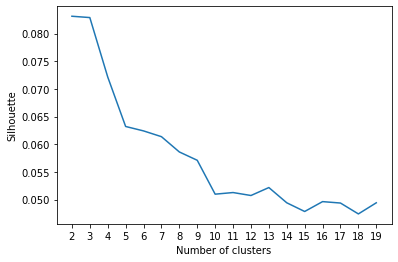

In [10]:
MIN_K = 2
MAX_K = 20

ks = np.arange(MIN_K, MAX_K)
sils = []
for k in ks:
    kmeans = KMeans(n_clusters=k, n_init=30)
    labels = kmeans.fit_predict(metabol_exprs)
    sils.append(sklearn.metrics.silhouette_score(metabol_exprs, labels))

plt.plot(sils)
plt.xticks(np.arange(0, len(ks)), ks)
plt.xlabel('Number of clusters')
plt.ylabel('Silhouette');

The best result is achieved with K=2.

The categorical data has between 2 and 7 classes. I'll fix K to each number of classes and compare the clusters with the true labels to see if they match.

I'll plot a 2D representation of the data using the t-SNE transformacion with two components.

In [11]:
tsne = TSNE(n_components=2, init='pca')
raw_data_tsne = tsne.fit_transform(metabol_exprs)

/usr/local/lib/python3.9/dist-packages/sklearn/manifold/_t_sne.py:805: FutureWarning: The default learning rate in TSNE will change from 200.0 to 'auto' in 1.2.
  warnings.warn(
/usr/local/lib/python3.9/dist-packages/sklearn/manifold/_t_sne.py:991: FutureWarning: The PCA initialization in TSNE will change to have the standard deviation of PC1 equal to 1e-4 in 1.2. This will ensure better convergence.
  warnings.warn(


In [12]:
categorical_variables = {2: ["asthma", "sex"],
                         3: ["education", "native", "parity"],
                         4: ["birth_weight", "iq", "behaviour"],
                         6: ["cohort"],
                         7: ["age"]}
true_labels = {}
for k, variables in categorical_variables.items():
    true_labels[k] = {var: classes.loc[:,var] for var in variables}
                
cluster_labels = []
results = []

asthma ['Acc: 0.893', 'ARI: 0.000', 'AMI: 0.000', 'Sil: 0.083']
sex ['Acc: 0.530', 'ARI: 0.000', 'AMI: 0.000', 'Sil: 0.083']
education ['Acc: 0.513', 'ARI: 0.000', 'AMI: 0.000', 'Sil: 0.083']
native ['Acc: 0.838', 'ARI: 0.000', 'AMI: 0.000', 'Sil: 0.083']
parity ['Acc: 0.455', 'ARI: 0.000', 'AMI: 0.000', 'Sil: 0.083']
birth_weight ['Acc: 0.266', 'ARI: -0.001', 'AMI: -0.001', 'Sil: 0.071']
iq ['Acc: 0.300', 'ARI: 0.002', 'AMI: 0.003', 'Sil: 0.071']
behaviour ['Acc: 0.288', 'ARI: 0.001', 'AMI: 0.001', 'Sil: 0.071']
cohort ['Acc: 0.207', 'ARI: 0.001', 'AMI: 0.002', 'Sil: 0.062']
age ['Acc: 0.319', 'ARI: 0.000', 'AMI: 0.000', 'Sil: 0.057']


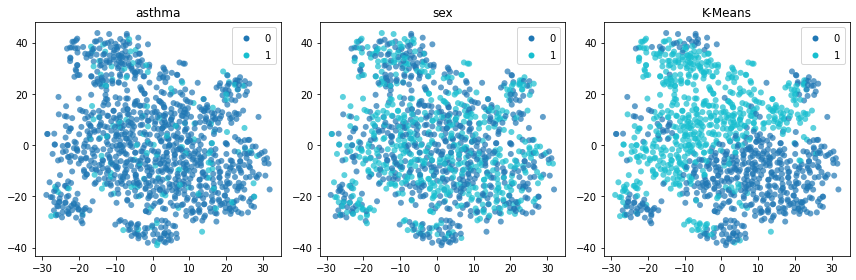

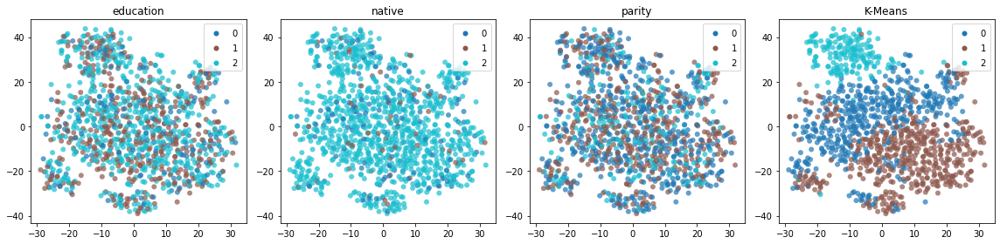

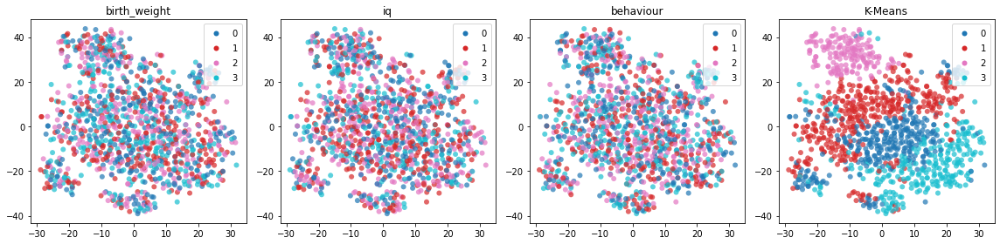

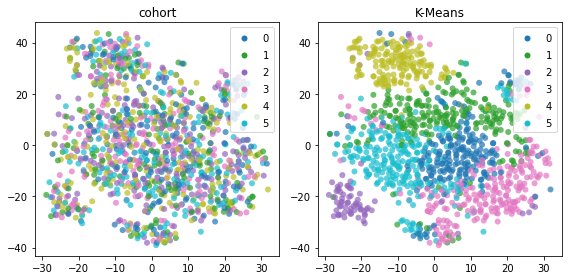

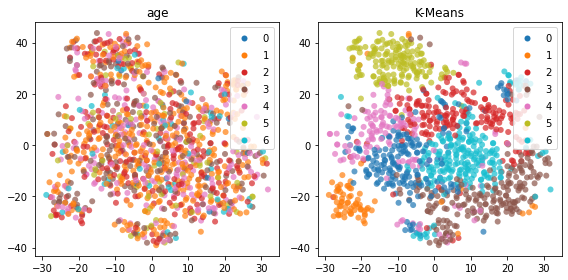

In [13]:
rl_method = "Raw data"
clust_method = "K-Means"
data = metabol_exprs
tsne_data = raw_data_tsne

for k in categorical_variables.keys():
    # Compute cluster assignments
    kmeans = KMeans(n_clusters=k, n_init=30)
    cluster_labels_ = kmeans.fit_predict(data)
    cluster_labels.append({"rl_method": rl_method, 
                           "clust_method": clust_method, 
                           "n_clusters": k, 
                           "labels": cluster_labels_})

    # Compute metrics
    for variable, labels in true_labels[k].items():
        metrics = evaluate_clustering(data, labels, cluster_labels_, False)
        print(variable, [f'{metric}: {value:.3f}' for metric, value in metrics.items()])
        result = {"rl_method": rl_method, 
                  "clust_method": clust_method, 
                  "n_clusters": k, 
                  "variable": variable}
        result.update(metrics)
        results.append(result)

    # Draw scatterplots
    labels = true_labels[k].copy()
    labels.update({clust_method: cluster_labels_})
    draw_multiple_labels(tsne_data, labels)

## GMM

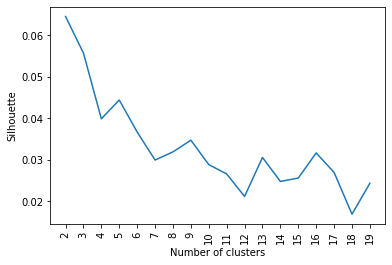

In [14]:
ks = np.arange(MIN_K, MAX_K)
sils = []
for k in ks:
    gmm = GaussianMixture(n_components=k, covariance_type='diag', n_init=30)
    labels = gmm.fit_predict(metabol_exprs)
    sils.append(sklearn.metrics.silhouette_score(metabol_exprs, labels))

plt.plot(sils)
plt.xticks(np.arange(0, len(ks)), ks, rotation=90)
plt.xlabel('Number of clusters')
plt.ylabel('Silhouette');

asthma ['Acc: 0.893', 'ARI: 0.000', 'AMI: 0.000', 'Sil: 0.065']
sex ['Acc: 0.530', 'ARI: 0.000', 'AMI: 0.000', 'Sil: 0.065']
education ['Acc: 0.513', 'ARI: 0.000', 'AMI: 0.000', 'Sil: 0.054']
native ['Acc: 0.838', 'ARI: 0.000', 'AMI: 0.000', 'Sil: 0.054']
parity ['Acc: 0.455', 'ARI: 0.000', 'AMI: 0.000', 'Sil: 0.054']
birth_weight ['Acc: 0.275', 'ARI: 0.001', 'AMI: 0.000', 'Sil: 0.043']
iq ['Acc: 0.289', 'ARI: -0.002', 'AMI: -0.001', 'Sil: 0.043']
behaviour ['Acc: 0.275', 'ARI: 0.001', 'AMI: 0.001', 'Sil: 0.043']
cohort ['Acc: 0.215', 'ARI: 0.002', 'AMI: 0.001', 'Sil: 0.047']
age ['Acc: 0.319', 'ARI: 0.000', 'AMI: 0.000', 'Sil: 0.040']


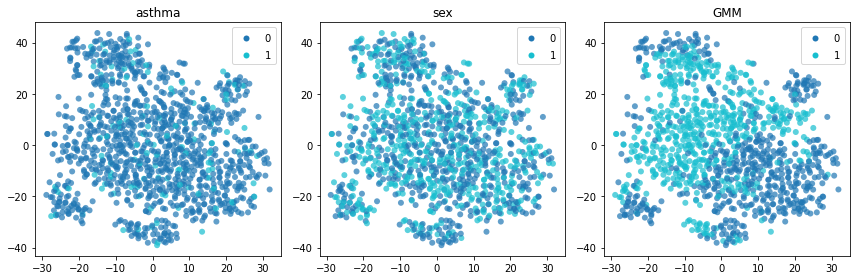

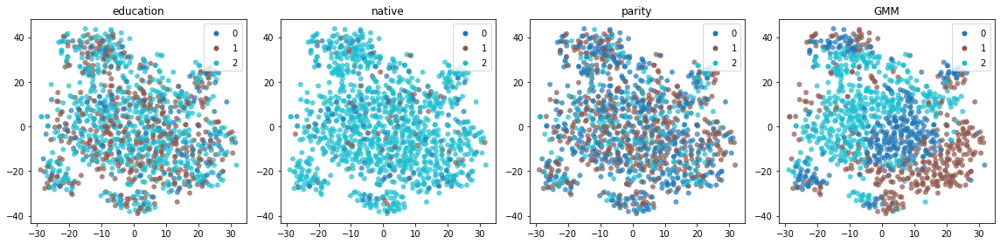

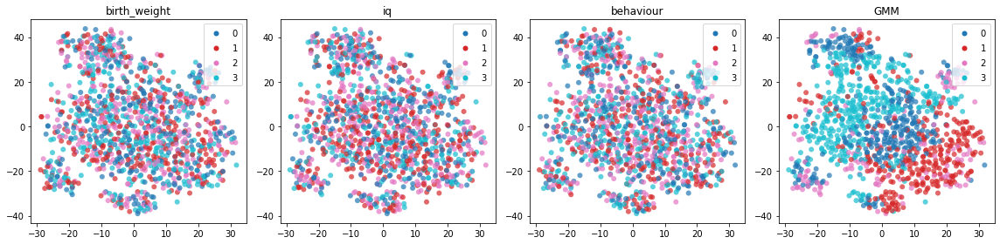

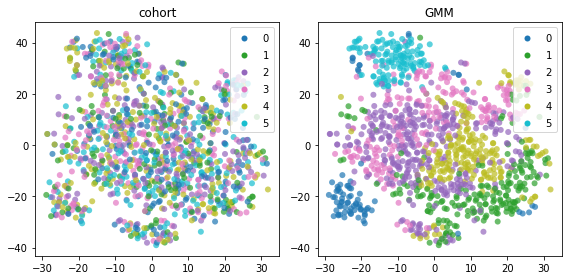

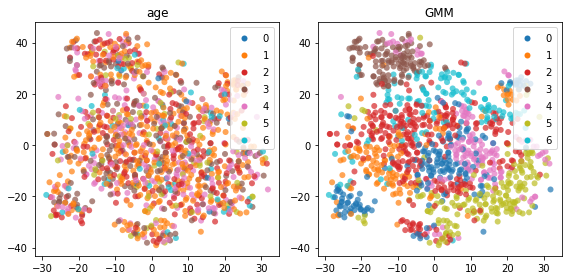

In [15]:
clust_method = "GMM"

for k in categorical_variables.keys():
    # Compute cluster assignments
    gmm = GaussianMixture(n_components=k, covariance_type='diag', n_init=30)
    cluster_labels_ = gmm.fit_predict(data)
    cluster_labels.append({"rl_method": rl_method, 
                       "clust_method": clust_method, 
                       "n_clusters": k, 
                       "labels": cluster_labels_})

    # Compute metrics
    for variable, labels in true_labels[k].items():
        metrics = evaluate_clustering(data, labels, cluster_labels_, False)
        print(variable, [f'{metric}: {value:.3f}' for metric, value in metrics.items()])
        result = {"rl_method": rl_method, 
                  "clust_method": clust_method, 
                  "n_clusters": k, 
                  "variable": variable} 
        result.update(metrics)
        results.append(result)

    # Draw scatterplots
    labels = true_labels[k].copy()
    labels.update({clust_method: cluster_labels_})
    draw_multiple_labels(tsne_data, labels)

## Agglomerative

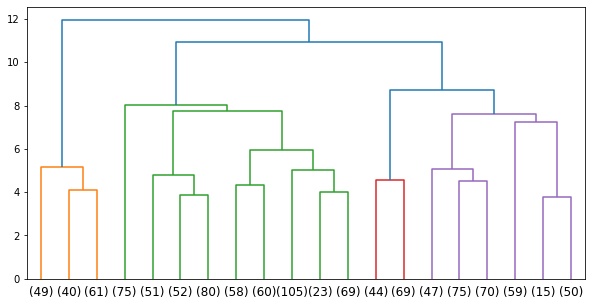

In [16]:
hier = hierarchy.linkage(metabol_exprs, method='ward', metric="euclidean")

plt.figure(figsize=(10, 5))
hierarchy.dendrogram(Z=hier, p=20, truncate_mode='lastp')
plt.show()

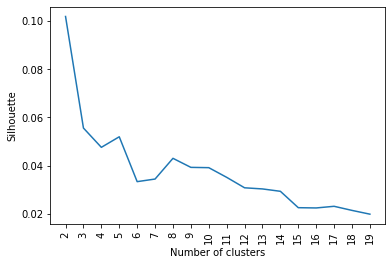

In [17]:
ks = np.arange(MIN_K, MAX_K)
sils = []
for k in ks:
    labels = hierarchy.cut_tree(hier, n_clusters=k).squeeze()
    sils.append(sklearn.metrics.silhouette_score(metabol_exprs, labels))

plt.plot(sils)
plt.xticks(np.arange(0, len(ks)), ks, rotation=90)
plt.xlabel('Number of clusters')
plt.ylabel('Silhouette');

asthma ['Acc: 0.893', 'ARI: 0.000', 'AMI: 0.000', 'Sil: 0.102']
sex ['Acc: 0.530', 'ARI: 0.000', 'AMI: 0.000', 'Sil: 0.102']
education ['Acc: 0.513', 'ARI: 0.000', 'AMI: 0.000', 'Sil: 0.056']
native ['Acc: 0.838', 'ARI: 0.000', 'AMI: 0.000', 'Sil: 0.056']
parity ['Acc: 0.455', 'ARI: 0.000', 'AMI: 0.000', 'Sil: 0.056']
birth_weight ['Acc: 0.264', 'ARI: -0.001', 'AMI: -0.001', 'Sil: 0.048']
iq ['Acc: 0.303', 'ARI: 0.001', 'AMI: 0.002', 'Sil: 0.048']
behaviour ['Acc: 0.278', 'ARI: -0.000', 'AMI: -0.000', 'Sil: 0.048']
cohort ['Acc: 0.196', 'ARI: -0.001', 'AMI: -0.002', 'Sil: 0.033']
age ['Acc: 0.319', 'ARI: 0.000', 'AMI: 0.000', 'Sil: 0.034']


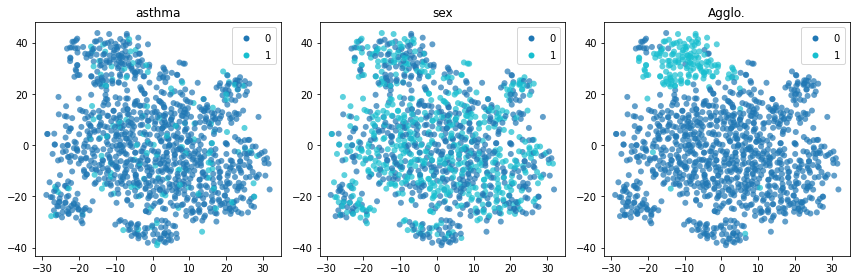

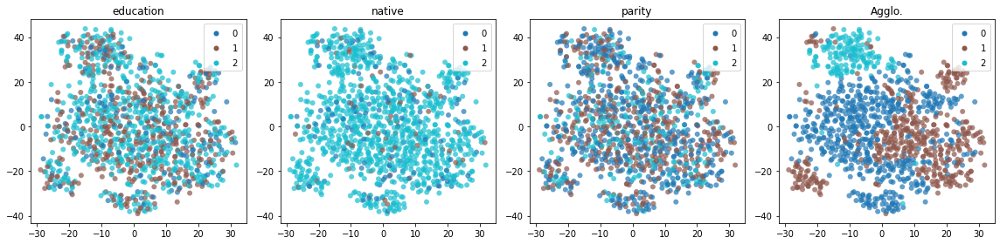

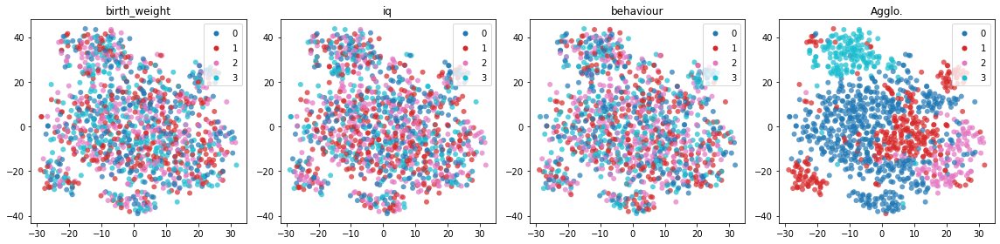

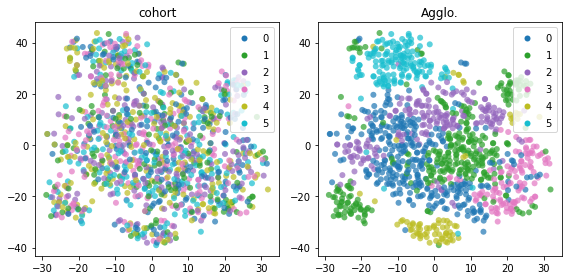

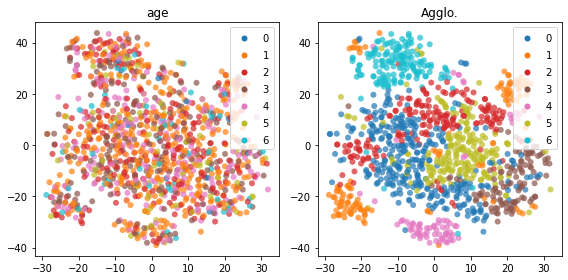

In [18]:
clust_method = "Agglo."

for k in categorical_variables.keys():
    # Compute cluster assignments
    cluster_labels_ = hierarchy.cut_tree(hier, n_clusters=k).squeeze()
    cluster_labels.append({"rl_method": rl_method, 
                       "clust_method": clust_method, 
                       "n_clusters": k, 
                       "labels": cluster_labels_})

    # Compute metrics
    for variable, labels in true_labels[k].items():
        metrics = evaluate_clustering(data, labels, cluster_labels_, False)
        print(variable, [f'{metric}: {value:.3f}' for metric, value in metrics.items()])
        result = {"rl_method": rl_method, 
                  "clust_method": clust_method, 
                  "n_clusters": k, 
                  "variable": variable}
        result.update(metrics)
        results.append(result)

    # Draw scatterplots
    labels = true_labels[k].copy()
    labels.update({clust_method: cluster_labels_})
    draw_multiple_labels(tsne_data, labels)

# PCA

In [19]:
# Find the number of PCs to explain 0.9 of the variance:
pca = PCA(n_components=0.9)
pca.fit(metabol_exprs)

z_pca = pca.transform(metabol_exprs)

# Number of PCs:
pca.n_components_

25

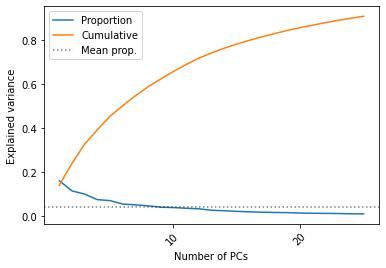

In [20]:
plt.plot(np.arange(0, pca.n_components_), pca.explained_variance_, label="Proportion")
plt.plot(np.arange(0, pca.n_components_), np.cumsum(pca.explained_variance_ratio_), label="Cumulative")
plt.axhline(y = np.mean(pca.explained_variance_), color='black', linestyle='dotted', alpha=0.5, label="Mean prop.")
plt.xticks(np.arange(9, pca.n_components_, 10), np.arange(10, pca.n_components_+1, 10), rotation=45, rotation_mode="anchor", ha='right')
plt.xlabel('Number of PCs')
plt.ylabel('Explained variance');
plt.legend();

## K-means

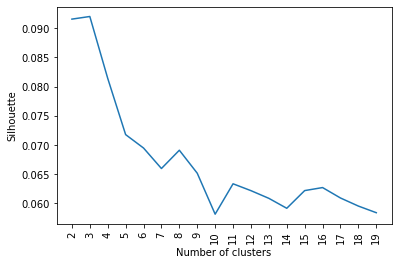

In [21]:
ks = np.arange(MIN_K, MAX_K)
sils = []
for k in ks:
    kmeans = KMeans(n_clusters=k, n_init=30)
    labels = kmeans.fit_predict(z_pca)
    sils.append(sklearn.metrics.silhouette_score(z_pca, labels))

plt.plot(sils)
plt.xticks(np.arange(0, len(ks)), ks, rotation=90)
plt.xlabel('Number of clusters')
plt.ylabel('Silhouette');

In [22]:
tsne = TSNE(n_components=2, init='pca')
z_pca_tsne = tsne.fit_transform(z_pca)

/usr/local/lib/python3.9/dist-packages/sklearn/manifold/_t_sne.py:805: FutureWarning: The default learning rate in TSNE will change from 200.0 to 'auto' in 1.2.
  warnings.warn(
/usr/local/lib/python3.9/dist-packages/sklearn/manifold/_t_sne.py:991: FutureWarning: The PCA initialization in TSNE will change to have the standard deviation of PC1 equal to 1e-4 in 1.2. This will ensure better convergence.
  warnings.warn(


asthma ['Acc: 0.893', 'ARI: 0.000', 'AMI: 0.000', 'Sil: 0.092']
sex ['Acc: 0.530', 'ARI: 0.000', 'AMI: 0.000', 'Sil: 0.092']
education ['Acc: 0.513', 'ARI: 0.000', 'AMI: 0.000', 'Sil: 0.092']
native ['Acc: 0.838', 'ARI: 0.000', 'AMI: 0.000', 'Sil: 0.092']
parity ['Acc: 0.455', 'ARI: 0.000', 'AMI: 0.000', 'Sil: 0.092']
birth_weight ['Acc: 0.266', 'ARI: -0.000', 'AMI: -0.000', 'Sil: 0.081']
iq ['Acc: 0.299', 'ARI: 0.004', 'AMI: 0.001', 'Sil: 0.081']
behaviour ['Acc: 0.286', 'ARI: 0.001', 'AMI: 0.001', 'Sil: 0.081']
cohort ['Acc: 0.206', 'ARI: 0.001', 'AMI: 0.002', 'Sil: 0.070']
age ['Acc: 0.319', 'ARI: 0.000', 'AMI: 0.000', 'Sil: 0.064']


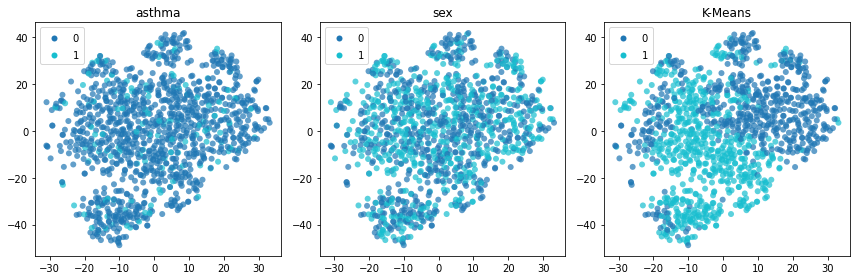

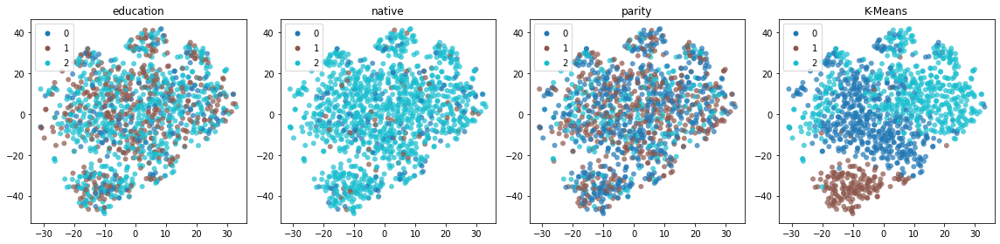

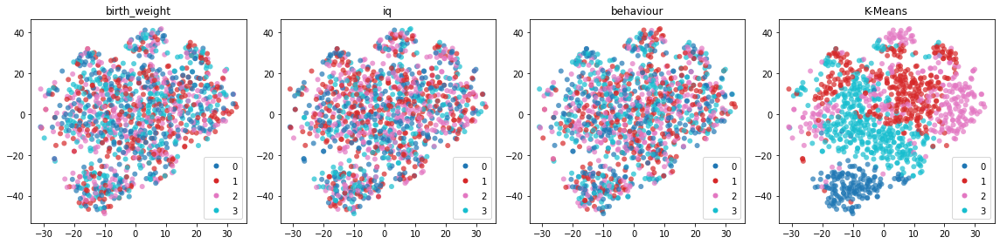

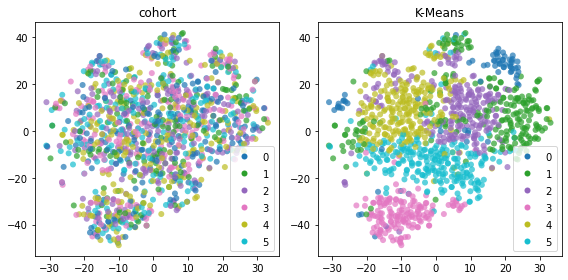

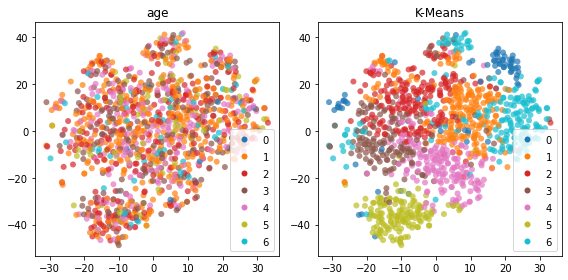

In [23]:
rl_method = "PCA"
clust_method = "K-Means"
data = z_pca
tsne_data = z_pca_tsne

for k in categorical_variables.keys():
    # Compute cluster assignments
    kmeans = KMeans(n_clusters=k, n_init=30)
    cluster_labels_ = kmeans.fit_predict(data)
    cluster_labels.append({"rl_method": rl_method, 
                       "clust_method": clust_method, 
                       "n_clusters": k, 
                       "labels": cluster_labels_})

    # Compute metrics
    for variable, labels in true_labels[k].items():
        metrics = evaluate_clustering(data, labels, cluster_labels_, False)
        print(variable, [f'{metric}: {value:.3f}' for metric, value in metrics.items()])
        result = {"rl_method": rl_method, 
                  "clust_method": clust_method, 
                  "n_clusters": k, 
                  "variable": variable}
        result.update(metrics)
        results.append(result)

    # Draw scatterplots
    labels = true_labels[k].copy()
    labels.update({clust_method: cluster_labels_})
    draw_multiple_labels(z_pca_tsne, labels)

## GMM

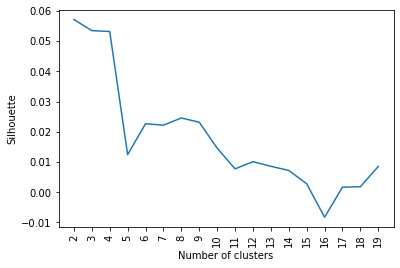

In [24]:
ks = np.arange(MIN_K, MAX_K)
sils = []
for k in ks:
    gmm = GaussianMixture(n_components=k, covariance_type='diag', n_init=30)
    labels = gmm.fit_predict(z_pca)
    sils.append(sklearn.metrics.silhouette_score(z_pca, labels))

plt.plot(sils)
plt.xticks(np.arange(0, len(ks)), ks, rotation=90)
plt.xlabel('Number of clusters')
plt.ylabel('Silhouette');

asthma ['Acc: 0.893', 'ARI: 0.000', 'AMI: 0.000', 'Sil: 0.057']
sex ['Acc: 0.530', 'ARI: 0.000', 'AMI: 0.000', 'Sil: 0.057']
education ['Acc: 0.513', 'ARI: 0.000', 'AMI: 0.000', 'Sil: 0.049']
native ['Acc: 0.838', 'ARI: 0.000', 'AMI: 0.000', 'Sil: 0.049']
parity ['Acc: 0.455', 'ARI: 0.000', 'AMI: 0.000', 'Sil: 0.049']
birth_weight ['Acc: 0.273', 'ARI: -0.000', 'AMI: 0.000', 'Sil: 0.053']
iq ['Acc: 0.300', 'ARI: 0.001', 'AMI: 0.002', 'Sil: 0.053']
behaviour ['Acc: 0.278', 'ARI: 0.001', 'AMI: 0.003', 'Sil: 0.053']
cohort ['Acc: 0.204', 'ARI: 0.003', 'AMI: 0.001', 'Sil: 0.014']
age ['Acc: 0.319', 'ARI: 0.000', 'AMI: 0.000', 'Sil: 0.013']


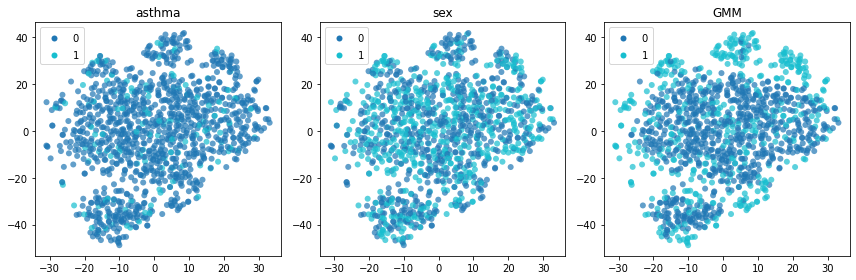

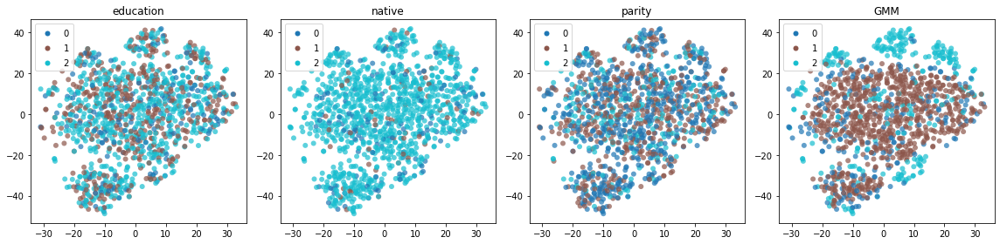

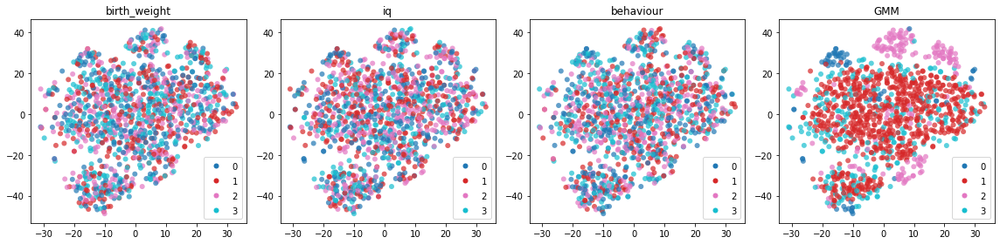

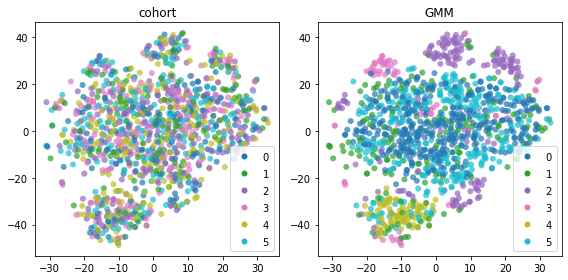

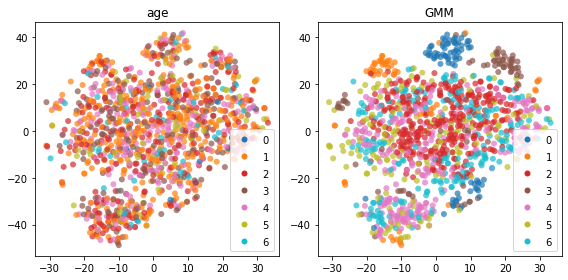

In [25]:
clust_method = "GMM"

for k in categorical_variables.keys():
    # Compute cluster assignments
    gmm = GaussianMixture(n_components=k, covariance_type='diag', n_init=30)
    cluster_labels_ = gmm.fit_predict(data)
    cluster_labels.append({"rl_method": rl_method, 
                       "clust_method": clust_method, 
                       "n_clusters": k, 
                       "labels": cluster_labels_})

    # Compute metrics
    for variable, labels in true_labels[k].items():
        metrics = evaluate_clustering(data, labels, cluster_labels_, False)
        print(variable, [f'{metric}: {value:.3f}' for metric, value in metrics.items()])
        result = {"rl_method": rl_method, 
                  "clust_method": clust_method, 
                  "n_clusters": k, 
                  "variable": variable}
        result.update(metrics)
        results.append(result)

    # Draw scatterplots
    labels = true_labels[k].copy()
    labels.update({clust_method: cluster_labels_})
    draw_multiple_labels(z_pca_tsne, labels)

## Agglomerative

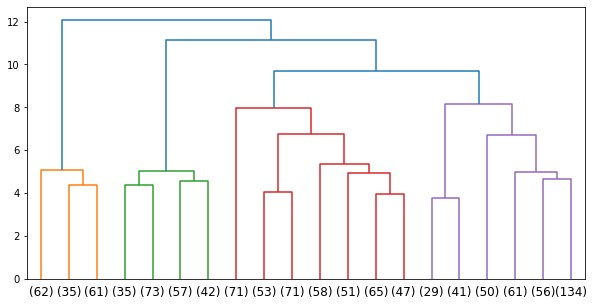

In [26]:
pca_hier = hierarchy.linkage(z_pca, method='ward', metric="euclidean")

plt.figure(figsize=(10, 5))
hierarchy.dendrogram(Z=pca_hier, p=20, truncate_mode='lastp')
plt.show()

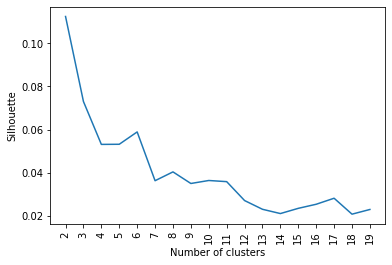

In [27]:
ks = np.arange(MIN_K, MAX_K)
sils = []
for k in ks:
    labels = hierarchy.cut_tree(pca_hier, n_clusters=k).squeeze()
    sils.append(sklearn.metrics.silhouette_score(z_pca, labels))

plt.plot(sils)
plt.xticks(np.arange(0, len(ks)), ks, rotation=90)
plt.xlabel('Number of clusters')
plt.ylabel('Silhouette');

asthma ['Acc: 0.893', 'ARI: 0.000', 'AMI: 0.000', 'Sil: 0.112']
sex ['Acc: 0.530', 'ARI: 0.000', 'AMI: 0.000', 'Sil: 0.112']
education ['Acc: 0.513', 'ARI: 0.000', 'AMI: 0.000', 'Sil: 0.073']
native ['Acc: 0.838', 'ARI: 0.000', 'AMI: 0.000', 'Sil: 0.073']
parity ['Acc: 0.455', 'ARI: 0.000', 'AMI: 0.000', 'Sil: 0.073']
birth_weight ['Acc: 0.266', 'ARI: -0.002', 'AMI: -0.002', 'Sil: 0.053']
iq ['Acc: 0.326', 'ARI: 0.006', 'AMI: 0.007', 'Sil: 0.053']
behaviour ['Acc: 0.275', 'ARI: 0.001', 'AMI: 0.001', 'Sil: 0.053']
cohort ['Acc: 0.206', 'ARI: 0.001', 'AMI: -0.000', 'Sil: 0.059']
age ['Acc: 0.319', 'ARI: 0.000', 'AMI: 0.000', 'Sil: 0.036']


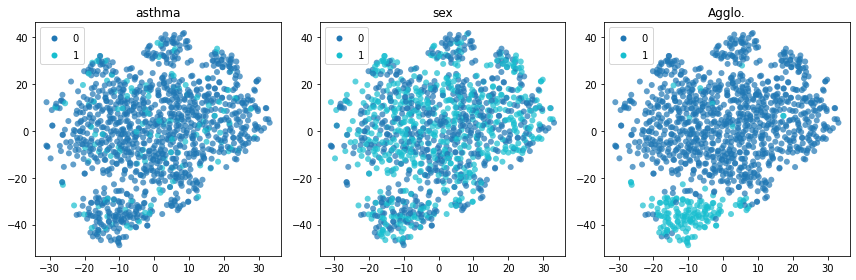

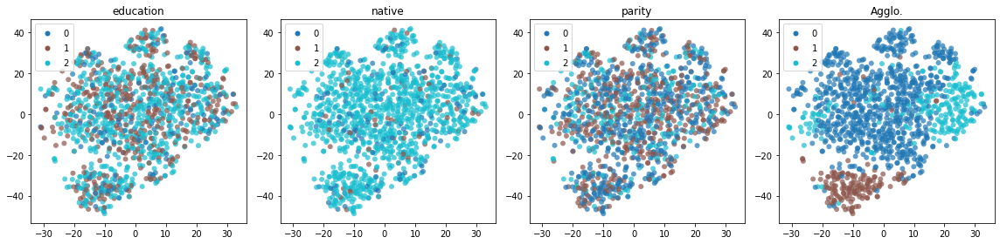

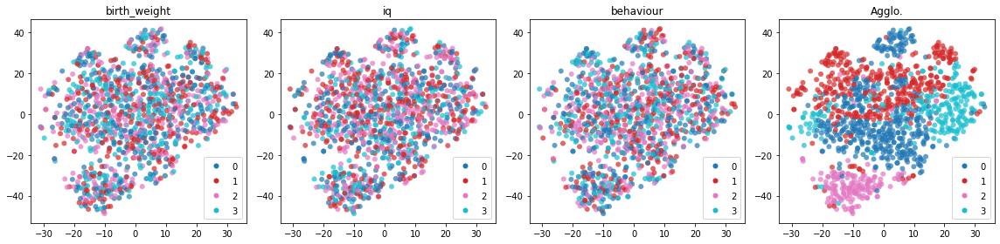

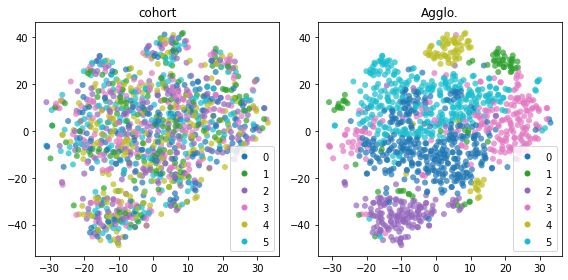

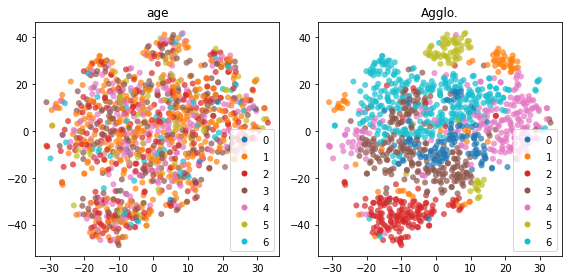

In [28]:
clust_method = "Agglo."

for k in categorical_variables.keys():
    # Compute cluster assignments
    cluster_labels_ = hierarchy.cut_tree(pca_hier, n_clusters=k).squeeze()
    cluster_labels.append({"rl_method": rl_method, 
                       "clust_method": clust_method, 
                       "n_clusters": k, 
                       "labels": cluster_labels_})

    # Compute metrics
    for variable, labels in true_labels[k].items():
        metrics = evaluate_clustering(data, labels, cluster_labels_, False)
        print(variable, [f'{metric}: {value:.3f}' for metric, value in metrics.items()])
        result = {"rl_method": rl_method, 
                  "clust_method": clust_method, 
                  "n_clusters": k, 
                  "variable": variable}
        result.update(metrics)
        results.append(result)

    # Draw scatterplots
    labels = true_labels[k].copy()
    labels.update({clust_method: cluster_labels_})
    draw_multiple_labels(z_pca_tsne, labels)

# Results

## Metrics

In [29]:
results = pd.DataFrame(results)
# Save the ametrics on a CSV file
results.to_csv("results/metrics_classic_featsel.csv", index=False)

results_mean = results.set_index(["rl_method","clust_method"]).groupby(level=[0,1]).mean()
results_mean = results_mean.iloc[:,1:]
results_mean.style.background_gradient(axis=0, cmap="cividis", text_color_threshold=0.3, subset=['Acc','ARI','AMI','Sil']).format('{:.2f}', subset=['Acc','ARI','AMI','Sil'])

In [30]:
results.style.background_gradient(axis=0, cmap="cividis", text_color_threshold=0.3, subset=['Acc','ARI','AMI','Sil']).format('{:.2f}', subset=['Acc','ARI','AMI','Sil'])

,rl_method,clust_method,n_clusters,variable,Acc,ARI,AMI,Sil
0,Raw data,K-Means,2,asthma,0.89,0.00,0.00,0.08
1,Raw data,K-Means,2,sex,0.53,0.00,0.00,0.08
2,Raw data,K-Means,3,education,0.51,0.00,0.00,0.08
3,Raw data,K-Means,3,native,0.84,0.00,0.00,0.08
4,Raw data,K-Means,3,parity,0.45,0.00,0.00,0.08
5,Raw data,K-Means,4,birth_weight,0.27,-0.00,-0.00,0.07
6,Raw data,K-Means,4,iq,0.30,0.00,0.00,0.07
7,Raw data,K-Means,4,behaviour,0.29,0.00,0.00,0.07
8,Raw data,K-Means,6,cohort,0.21,0.00,0.00,0.06
9,Raw data,K-Means,7,age,0.32,0.00,0.00,0.06


There is no match between any of the clusters found and the categorical data. The high accuracy values on the variables "asthma" and "native" are due to there being a groups which contains the majority of the observations, so a random assignment would also get a high accuracy.

## Compare assignments

In [31]:
cluster_labels = pd.DataFrame(cluster_labels)

# Save the assignments on a CSV file
pd.DataFrame(cluster_labels).to_csv("results/assign_classic_featsel.csv", index=False)

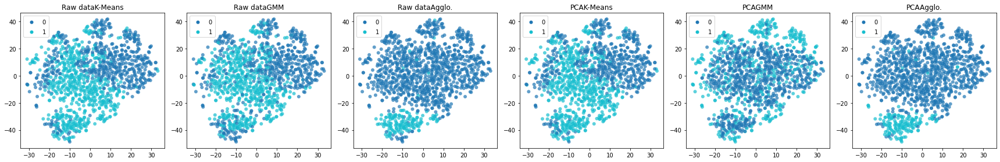

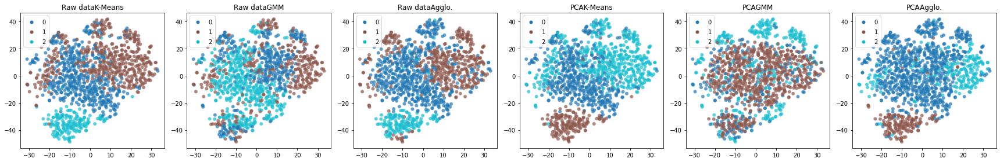

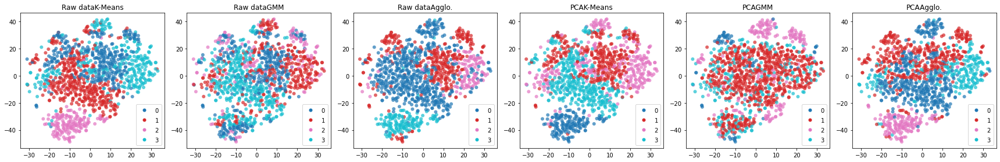

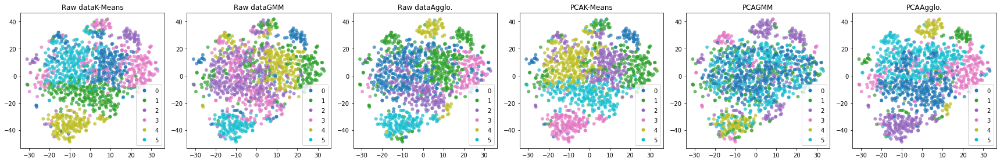

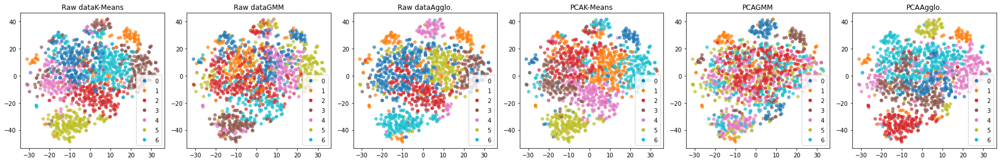

In [32]:
for k in categorical_variables.keys():
    clusters = cluster_labels[cluster_labels.n_clusters==k]
    labels = {clusters.rl_method[i] + clusters.clust_method[i]: clusters.labels[i] for i in clusters.index}
    draw_multiple_labels(z_pca_tsne, labels, max_cols=6)

There seems to be a lot of overlaping between the found clusters with the different methods, with the exception of "PCA -  GMM", which finds a unique structure.